<a href="https://colab.research.google.com/github/likeshd/face_detection/blob/main/Face_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [37]:
!pip install mediapipe==0.10.11

In [39]:
import mediapipe as mp
import cv2
import sys # Import sys for exiting if image not found

In [40]:
# Initialize Mediapipe Face Mesh and Drawing Utilities
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles # Provides standard drawing styles

In [41]:
# Define the image path
image_path = '/content/2.jpg'

In [42]:
from google.colab.patches import cv2_imshow


In [43]:
# Use a 'with' statement for proper resource management
# static_image_mode=True is correct for a single image
# max_num_faces=1 is good if you only expect one face
# refine_landmarks=True can improve landmark accuracy, especially around eyes/lips
# min_detection_confidence=0.5 is default, can adjust if needed
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    refine_landmarks=True,
    min_detection_confidence=0.5) as face_mesh:

    # Read the image using OpenCV
    img = cv2.imread(image_path)

    # --- Error Handling: Check if the image was loaded successfully ---
    if img is None:
        print(f"Error: Could not load image from {image_path}")
        print("Please make sure the image file exists and the path is correct.")
        sys.exit() # Exit the script if image isn't found

    # Convert the image from BGR (OpenCV default) to RGB (Mediapipe default)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Process the image to find face landmarks
    results = face_mesh.process(img_rgb)

    # Create a copy of the original image to draw on
    # This is good practice if you want to preserve the original image
    annotated_image = img.copy()

    # --- Check if any faces were detected ---
    if results.multi_face_landmarks:
        print(f"Detected {len(results.multi_face_landmarks)} face(s).")
        # Iterate through each detected face
        for face_landmarks in results.multi_face_landmarks:
            # --- Use drawing utilities to draw the landmarks and connections ---
            # mp_drawing.draw_landmarks takes the image, landmark list, and connections
            # We use the standard face mesh connections and styles

            # Draw the face mesh tesselation (triangles)
            mp_drawing.draw_landmarks(
                image=annotated_image,
                landmark_list=face_landmarks,
                connections=mp_face_mesh.FACEMESH_TESSELATION, # Defines the connections to draw
                landmark_drawing_spec=None, # Use default style for landmarks
                connection_drawing_spec=mp_drawing_styles # Use standard styles for connections
                .get_default_face_mesh_tesselation_style())

            # Draw the face contours (eyes, eyebrows, lips, face oval)
            mp_drawing.draw_landmarks(
                image=annotated_image,
                landmark_list=face_landmarks,
                connections=mp_face_mesh.FACEMESH_CONTOURS,
                landmark_drawing_spec=None,
                 connection_drawing_spec=mp_drawing_styles
                .get_default_face_mesh_contours_style())

            # Draw the irises
            mp_drawing.draw_landmarks(
                image=annotated_image,
                landmark_list=face_landmarks,
                connections=mp_face_mesh.FACEMESH_IRISES,
                landmark_drawing_spec=None,
                 connection_drawing_spec=mp_drawing_styles
                .get_default_face_mesh_iris_connections_style())

    else:
        print("No faces detected in the image.")
        # If no faces are detected, display the original image
        annotated_image = img




No faces detected in the image.


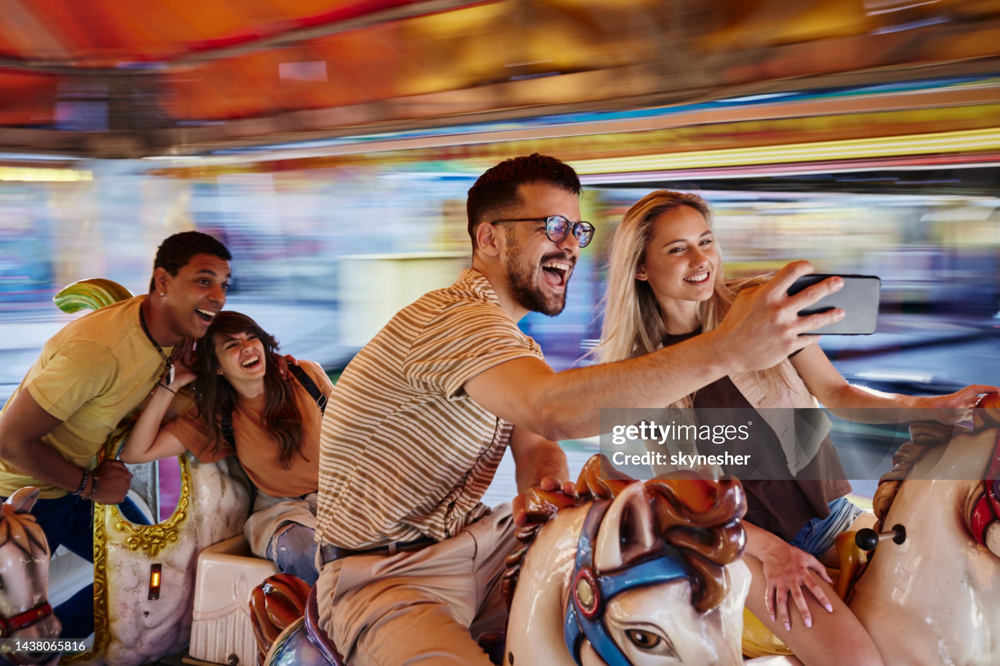

In [36]:
cv2_imshow(annotated_image)

In [10]:
cv2.waitKey(0)
cv2.destroyAllWindows()

In [1]:
!pip install inspireface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.2/44.2 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 41.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 2.5 MB/s eta 0:00:00


In [44]:
import cv2
import inspireface as isf

# Create a session with optional features
opt = isf.HF_ENABLE_NONE
session = isf.InspireFaceSession(opt, isf.HF_DETECT_MODE_ALWAYS_DETECT)





In [10]:
from google.colab.patches import cv2_imshow


In [11]:
image_path = "/content/2.jpg"
# Load the image using OpenCV.
image = cv2.imread(image_path)

3
a
a
a


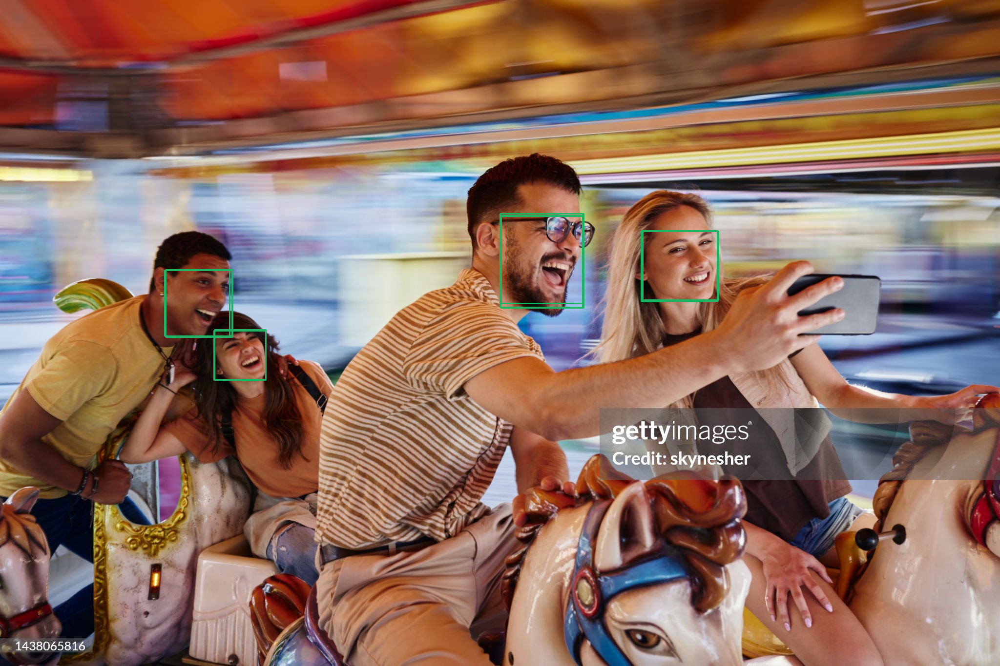

In [16]:
# Perform face detection on the image.
faces = session.face_detection(image)
print(len(faces))

for face in faces:
    print("a")
    x1, y1, x2, y2 = face.location
    rect = ((x1, y1), (x2, y2), face.roll)
     # Calculate center, size, and angle
    center = ((x1 + x2) / 2, (y1 + y2) / 2)
    size = (x2 - x1, y2 - y1)
    angle = face.roll

    # Apply rotation to the bounding box corners
    rect = ((center[0], center[1]), (size[0], size[1]), angle)
    box = cv2.boxPoints(rect)
    box = box.astype(int)

    # Draw the rotated bounding box
    cv2.drawContours(image, [box], 0, (100, 180, 29), 2)

cv2_imshow(image)


In [23]:
# This is a hypothetical example, check the actual documentation!
session = isf.InspireFaceSession(isf.HF_ENABLE_NONE, isf.HF_DETECT_MODE_ALWAYS_DETECT)

# Set detection confidence threshold
session.set_detection_confidence_threshold(0.5)


In [17]:
!pip install -U inspireface


In [24]:

# Read image
image = cv2.imread("/content/2.jpg")
assert image is not None, "Please check if the image path is correct"


In [27]:

# Perform face detection
faces = session.face_detection(image)
print(f"Detected {len(faces)} faces")

# Draw detection results on image
draw = image.copy()
for idx, face in enumerate(faces):
    # Get face bounding box coordinates
    x1, y1, x2, y2 = face.location

    # Calculate rotated box parameters
    center = ((x1 + x2) / 2, (y1 + y2) / 2)
    size = (x2 - x1, y2 - y1)
    angle = face.roll

    # Draw rotated box
    rect = ((center[0], center[1]), (size[0], size[1]), angle)
    box = cv2.boxPoints(rect)
    box = box.astype(int)
    cv2.drawContours(draw, [box], 0, (100, 180, 29), 2)

    # Draw landmarks
    landmarks = session.get_face_dense_landmark(face)
    # landmarks = landmarks.astype(int)
    # print(landmarks)
    for x, y in landmarks.astype(int):
        cv2.circle(draw, (x, y), 0, (220, 100, 0), 2)

Detected 4 faces
